In [1]:
import itertools
import numpy as np
import os
import seaborn as sns
from tqdm import tqdm_notebook
from dataclasses import asdict, dataclass, field
import vsketch
import shapely.geometry as sg
from shapely.geometry import box, MultiLineString, Point, MultiPoint, Polygon, MultiPolygon, LineString
import shapely.affinity as sa
import shapely.ops as so
import matplotlib.pyplot as plt
import pandas as pd

import vpype_cli
from typing import List, Generic
from genpen import genpen as gp, utils as utils
from scipy import stats as ss
import geopandas
from shapely.errors import TopologicalError
import functools
%load_ext autoreload
%autoreload 2
import vpype
from skimage import io
from pathlib import Path

import bezier

from sklearn.preprocessing import minmax_scale
from skimage import feature
from genpen.utils import Paper

from scipy import spatial, stats
from scipy.ndimage import gaussian_filter
from scipy.integrate import odeint
from functools import partial

from genpen.grower import *
import fn
from genpen.axicam import AxiCam

# on wooden thing, about 4x4 inches

In [2]:
# make page
paper_size = '4x4 inches'
border:float=10
paper = Paper(paper_size)

drawbox = paper.get_drawbox(border)
db = gp.Poly(drawbox)


In [3]:
start_point = Point(db.p.centroid.x, db.bottom+20)
target_point = Point(db.p.centroid.x, db.p.centroid.y)

In [4]:
get_xscale = ss.uniform(loc=0.7, scale=0.6).rvs

In [5]:
get_yscale = ss.expon(loc=0.7, scale=0.6).rvs

In [6]:
def random_stretch(poly):
    xscale = get_xscale()
    yscale = get_yscale()
    return sa.scale(poly['geometry'], xscale, yscale, origin=poly['geometry'].centroid)

In [7]:
params = GrowerParams(
    rad_func='loss_scaled_rad',
    rad_range=(1, 0.5),
    loss_range=(15, 20),
    n_pts_eval_per_iter=3,
    n_pts_add_per_iter=1,
    pt_to_poly_func='reg_poly',
    n_corners=4,
    loss_func='distance_from_target',
    rotations=45,
    halt_condition_func='below_loss_threshold',
    loss_threshold=15,
)
poly = gp.RegPolygon(start_point, n_corners=4, radius=0.4, rotation=45).poly
g = Grower(poly=poly, params=params, target=target_point)

 13%|█▎        | 40/300 [00:00<00:02, 86.76it/s] 

14.775238547343454


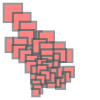

In [8]:
g.grow(300)
print(g.selected_pts.loss.mean())
g.mpoly


 26%|██▋       | 79/300 [00:03<00:09, 24.08it/s]


9.790226399117739


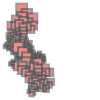

In [9]:
g._p.rad_range = (1, 0.3)
g._p.loss_range = (10, 15)
g._p.n_pts_eval_per_iter=3
g._p.loss_threshold=10
g.grow(300)
print(g.selected_pts.loss.mean())
g.mpoly


 94%|█████████▍| 282/300 [00:36<00:02,  7.62it/s]

4.908424934312356


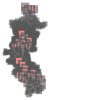

In [10]:
g._p.rad_range = (0.8, 0.2)
g._p.loss_range = (5, 10)
g._p.n_pts_eval_per_iter=3
g._p.loss_threshold=5
g.grow(300)
print(g.selected_pts.loss.mean())
g.mpoly


In [12]:
g._p.rad_range = (0.6, 0.2)
g._p.loss_range = (0, 5)
g._p.n_pts_eval_per_iter=3
g._p.n_pts_add_per_iter = 1
g._p.loss_threshold=1
g.grow(100)
print(g.selected_pts.loss.mean())
g.mpoly


100%|██████████| 100/100 [00:29<00:00,  3.39it/s]

13.328754797273524


In [19]:
g._p.rad_range = (1.2, 0.6)
g._p.loss_range = (0, 10)
g._p.n_pts_eval_per_iter=3
g._p.n_pts_add_per_iter = 2
g._p.loss_func = 'negative_haussdorf_from_agg'
g._p.halt_condition_func='return_false'
g.grow(185)
print(g.selected_pts.loss.mean())
g.mpoly


100%|██████████| 185/185 [03:19<00:00,  1.08s/it]

17.912848672189806


In [20]:
len(g.mpoly)

1364

In [21]:
polys = gp.make_like(gp.merge_Polygons([p.buffer(-0.00001, cap_style=2, join_style=2) for p in g.polys]), drawbox)

In [761]:
polys = gp.merge_Polygons([p.buffer(-0.01, cap_style=2, join_style=2) for p in g.polys])

In [22]:
fills = []
for poly in polys:
    prms = gp.ScaleTransPrms(
        n_iters=200,
        d_buffer=ss.uniform(loc=-9.4, scale=0.2).rvs(),
        d_translate_factor=0.6,
        angles=ss.uniform(loc=0, scale=180).rvs(),
    )
    p = gp.Poly(poly)
    p.fill_scale_trans(**prms.prms)
    fills.append(p.fill)

In [23]:
lss = gp.make_like(gp.merge_LineStrings([p.boundary for p in g.polys]), drawbox)

In [24]:
lss

In [25]:
sk = vsketch.Vsketch()
sk.size(paper.page_format_mm)
sk.scale('1mm')
sk.penWidth('0.3mm')

counter = 0
for ls in lss:
    counter += 1
    sk.stroke(counter)
    sk.geometry(ls)
    
sk.display(color_mode='layer')

<?xml version="1.0" encoding="utf-8" ?>
 
 
 
 
 image/svg+xml 
 
 2022-01-31T22:07:06.084837 
 
 
 
 
 
 
 
 
 <polygon points="191.6532,51.3128 191.6532,51.3128 191.6532,51.3128 191.6532,51.3128 191.6532,51.3128 191.6532,51.3128 191.6532,51.3128 191.6532,51.3128 191.6532,51.3127 191.6532,51.3127 191.6532,51.3127 191.6532,51.3127 191.6532,51.3127 191.6532,51.3127 191.6532,51.3127 191.6532,51.3127 191.6532,51.3127 190.1147,51.3127 190.1147,51.3127 190.1147,51.3127 190.1147,51.3127 190.1147,51.3127 190.1147,51.3127 190.1147,51.3127 190.1147,51.3127 190.1147,51.3127 190.1147,51.3128 190.1147,51.3128 190.1147,51.3128 190.1147,51.3128 190.1147,51.3128 190.1147,51.3128 190.1147,51.3128 190.1147,51.3128 190.1147,56.8213 181.301,56.8213 181.301,51.3128 181.301,51.3128 181.301,51.3128 181.301,51.3128 181.301,51.3128 181.301,51.3128 181.301,51.3128 181.301,51.3128 181.301,51.3127 181.301,51.3127 181.301,51.3127 181.301,51.3127 181.301,51.3127 181.301,51.3127 181.301,51.3127 181.301,51.3127 181.301,51.3127 180.636,51.3127 180.636,51.3127 180.636,51.3127 180.636,51.3127 180.636,51.3127 180.636,51.3127 180.636,51.3127 180.636,51.3127 180.636,51.3127 180.636,51.3128 180.636,51.3128 180.636,51.3128 180.636,51.3128 180.636,51.3128 180.636,51.3128 180.636,51.3128 180.636,51.3128 180.636,62.33 180.636,62.33 180.636,62.33 180.636,62.33 180.636,62.33 180.636,62.33 180.636,62.33 180.636,62.33 180.636,62.33 180.636,62.33 180.636,62.33 180.636,62.33 180.636,62.33 180.636,62.33 180.636,62.33 180.636,62.33 180.636,62.33 191.6532,62.33 191.6532,62.33 191.6532,62.33 191.6532,62.33 191.6532,62.33 191.6532,62.33 191.6532,62.33 191.6532,62.33 191.6532,62.33 191.6532,62.33 191.6532,62.33 191.6532,62.33 191.6532,62.33 191.6532,62.33 191.6532,62.33 191.6532,62.33 191.6532,62.33"/>
 
 
 <polygon points="191.6532,62.33 191.6532,62.33 186.1446,62.33 186.1446,62.33 186.1446,62.33 186.1446,62.33 186.1446,62.33 186.1446,62.33 186.1446,62.33 186.1446,62.33 186.1446,62.33 186.1446,62.33 186.1446,62.33 186.1446,62.33 186.1446,62.33 186.1446,62.33 186.1446,62.33 186.1446,62.33 186.1446,62.33 186.1446,64.2334 186.1446,64.2334 186.1446,64.2334 186.1446,64.2334 186.1446,64.2334 186.1446,64.2334 186.1446,64.2334 186.1446,64.2334 186.1446,64.2334 186.1446,64.2334 186.1446,64.2334 186.1446,64.2334 186.1446,64.2334 186.1446,64.2334 186.1446,64.2334 186.1446,64.2334 186.1446,64.2334 197.1618,64.2334 197.1618,64.2334 197.1618,64.2334 197.1618,64.2334 197.1618,64.2334 197.1618,64.2334 197.1618,64.2334 197.1618,64.2334 197.1618,64.2334 197.1619,64.2334 197.1619,64.2334 197.1619,64.2334 197.1619,64.2334 197.1619,64.2334 197.1619,64.2334 197.1619,64.2334 197.1619,64.2334 197.1619,53.2162 197.1619,53.2162 197.1619,53.2162 197.1619,53.2162 197.1619,53.2162 197.1619,53.2162 197.1619,53.2162 197.1619,53.2162 197.1618,53.2162 197.1618,53.2162 197.1618,53.2162 197.1618,53.2162 197.1618,53.2162 197.1618,53.2162 197.1618,53.2162 197.1618,53.2162 197.1618,53.2162 191.6532,53.2162 191.6532,53.2162 191.6532,53.2162 191.6532,53.2162 191.6532,53.2162 191.6532,53.2162 191.6532,53.2162 191.6532,53.2162 191.6532,53.2162 191.6532,53.2162 191.6532,53.2162 191.6532,53.2162 191.6532,53.2162 191.6532,53.2162 191.6532,53.2162 191.6532,53.2162 191.6532,53.2162 191.6532,62.33"/>
 
 
 <polygon points="180.636,62.33 180.636,62.33 180.636,56.0004 180.636,56.0004 180.636,56.0004 180.636,56.0004 180.636,56.0004 180.636,56.0004 180.636,56.0004 180.636,56.0004 180.636,56.0004 180.636,56.0004 180.636,56.0004 180.636,56.0004 180.636,56.0004 180.636,56.0004 180.636,56.0004 180.636,56.0004 180.636,56.0004 175.1274,56.0004 175.1274,56.0004 175.1274,56.0004 175.1274,56.0004 175.1274,56.0004 175.1274,56.0004 175.1274,56.0004 175.1274,56.0004 175.1274,56.0004 175.1274,56.0004 175.1274,56.0004 175.1274,56.0004 175.1274,56.0004 175.1274,56.0004 175.1274,56.0004 175.1274,56.0004 175.1274,56.0004 175.1274,67.0176 175.1274,67.0176 175.1274,67.0176 175.1274,67.0176 175.1274,67.0176 175.1274,67.0176 175.1274,67.0176 175.1274,

In [131]:
import fn

In [132]:
plot_id = fn.new_plot_id()

saved 20220130-135042_096695-bbd12-f897c5 to s3://algorithmic-ink/current_plot_id


In [133]:
savedir='/home/naka/art/plotter_svgs'

In [134]:
savepath = Path(savedir).joinpath(f'{plot_id}.svg').as_posix()
sk.save(savepath)

In [135]:
from genpen.axicam import pov

In [136]:
pov.list_ports()

Port 0 is not working.
Port 1 is working and reads images (480.0 x 640.0)
Port 2 is not working.


In [ ]:
ac = AxiCam(plot_id=plot_id, camera_index=3)

In [ ]:
ac.init_cam()

In [ ]:
ac.cam.video_preview()

hit q to quit


In [ ]:
ac.ad.options.speed_penup = 80

In [ ]:
ac.ad.options.accel = 40
ac.ad.options.pen_raise_rate = 85

In [ ]:
ac.ad.options.speed_pendown = 55
ac.ad.update()

In [ ]:
ac.plot_layers(wait_times=0.3, start_layer=21)